# Computer Vision 2023 Assignment 1: Image filtering.

In this prac you will research, implement and test some image filtering operations. Image filtering by convolution is a fundamental step in many computer vision tasks and you will find it useful to have a firm grasp of how it works. For example, later in the course we will come across Convolutional Neural Networks (CNNs) which are built from convolutional image filters.

The main aims of the prac are:

- to understand the basics of how images are stored and processed in memory;
- to gain exposure to several common image filters, and understand how they work;
- to get practical experience implementing convolutional image filters;
- to test your intuition about image filtering by running some experiments;
- to report your results in a clear and concise manner.

*This assignment relates to the following ACS CBOK areas: abstraction, design, hardware and software, data and information, HCI and programming.*

## General instructions

Follow the instructions in this Python notebook and the accompanying file *a1code.py* to answer each question. It's your responsibility to make sure your answer to each question is clearly labelled and easy to understand. Note that most questions require some combination of Python code, graphical output, and text analysing or describing your results. Although we will check your code as needed, marks will be assigned based on the quality of your write up rather than for code correctness! This is not a programming test - we are more interested in your understanding of the topic.

Only a small amount of code is required to answer each question. We will make extensive use of the Python libraries

- [numpy](numpy.org) for mathematical functions
- [skimage](https://scikit-image.org) for image loading and processing
- [matplotlib](https://matplotlib.org/stable/index.html) for displaying graphical results
- [jupyter](https://jupyter.org) for Jupyter Notebooks

You should get familiar with the documentation for these libraries so that you can use them effectively.

# The Questions

To get started, below is some setup code to import the libraries we need. You should not need to edit it.

In [28]:
# Numpy is the main package for scientific computing with Python. 
import numpy as np

#from skimage import io

# Imports all the methods we define in the file a1code.py
from a1code import *

# Matplotlib is a useful plotting library for python 
import matplotlib.pyplot as plt
# This code is to make matplotlib figures appear inline in the
# notebook rather than in a new window.
%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# Some more magic so that the notebook will reload external python modules;
# see http://stackoverflow.com/questions/1907993/autoreload-of-modules-in-ipython
%load_ext autoreload
%autoreload 2
%reload_ext autoreload

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Question 0: Numpy warm up! (5%)

Before starting the assignment, make sure you have a working Python 3 installation, with up to date versions of the libraries mentioned above. If this is all new to you, I'd suggest  downloading an all in one Python installation such as [Anaconda](https://www.anaconda.com/products/individual). Alternatively you can use a Python package manager such as pip or conda, to get the libraries you need. If you're struggling with this please ask a question on the MyUni discussion forum.

For this assignment, you need some familiarity with numpy syntax. The numpy QuickStart should be enough to get you started:

https://numpy.org/doc/stable/user/quickstart.html

Here are a few warm up exercises to make sure you understand the basics. Answer them in the space below. Be sure to print the output of each question so we can see it!

1. Create a 1D numpy array Z with 12 elements. Fill with values 1 to 12.
2. Reshape Z into a 2D numpy array A with 3 rows and 4 columns.
3. Reshape Z into a 2D numpy array B with 4 rows and 3 columns.
4. Calculate the *matrix* product of A and B.
5. Calculate the *element wise* product of $A$ and $B^T$ (B transpose).


In [29]:
import numpy as np

# 1. Create a 1D numpy array Z with 12 elements. Fill with values 1 to 12.
Z = np.arange(1, 13)
print("Z:")
print(Z)

# 2. Reshape Z into a 2D numpy array A with 3 rows and 4 columns.
A = Z.reshape(3, 4)
print("\nA:")
print(A)

# 3. Reshape Z into a 2D numpy array B with 4 rows and 3 columns.
B = Z.reshape(4, 3)
print("\nB:")
print(B)

# 4. Calculate the matrix product of A and B.
matrix_product = np.dot(A, B)
print("\nMatrix Product of A and B:")
print(matrix_product)

# 5. Calculate the element-wise product of A and B^T (B transpose).
arrayBT = B.T
elementwise_product = A * arrayBT
print("\nElement-wise Product of A and B^T:")
print(elementwise_product)


Z:
[ 1  2  3  4  5  6  7  8  9 10 11 12]

A:
[[ 1  2  3  4]
 [ 5  6  7  8]
 [ 9 10 11 12]]

B:
[[ 1  2  3]
 [ 4  5  6]
 [ 7  8  9]
 [10 11 12]]

Matrix Product of A and B:
[[ 70  80  90]
 [158 184 210]
 [246 288 330]]

Element-wise Product of A and B^T:
[[  1   8  21  40]
 [ 10  30  56  88]
 [ 27  60  99 144]]


You need to be comfortable with numpy arrays because that is how we store images. Let's do that next!

## Question 1: Loading and displaying an image (10%)

Below is a function to display an image using the pyplot module in matplotlib. Implement the `load()` and `print_stats()` functions in a1code.py so that the following code loads the mandrill image, displays it and prints its height, width and channel. 

In [34]:
def display(img, caption=''):
    # Show image using pyplot 
    plt.figure()
    img = np.clip(img, 0, 1)
    plt.imshow(img)
    plt.title(caption)
    plt.axis('off')
    plt.show()

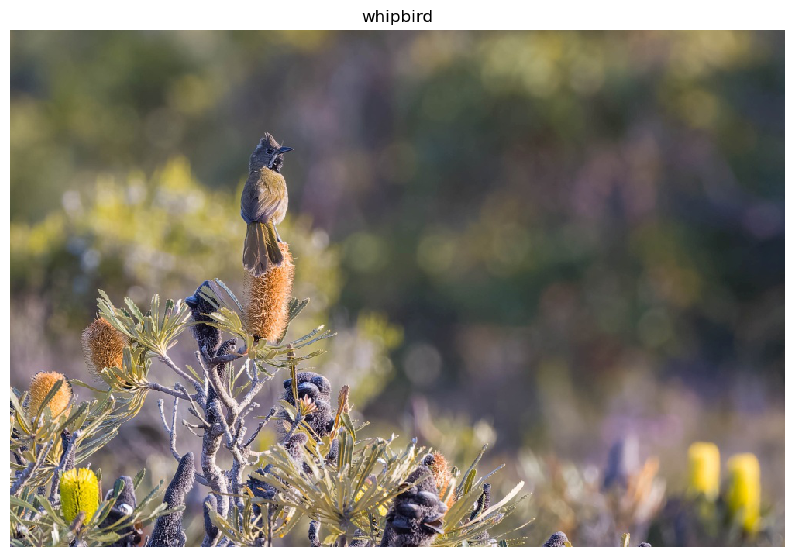

height:  667
width:  1000
channel:  3


In [35]:
image1 = load('images/whipbird.jpg')
      
display(image1, 'whipbird')

print_stats(image1)

Return to this question after reading through the rest of the assignment. Find 2 more images to use as test cases in this assignment for all the following questions and display them below. Use your print_stats() function to display their height, width and number of channels. Explain *why* you have chosen each image.

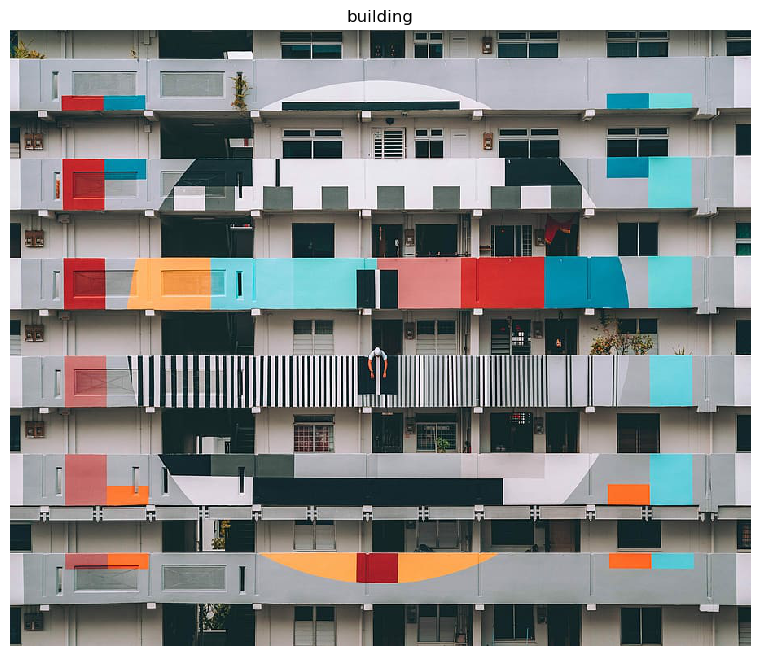

height:  757
width:  910
channel:  3


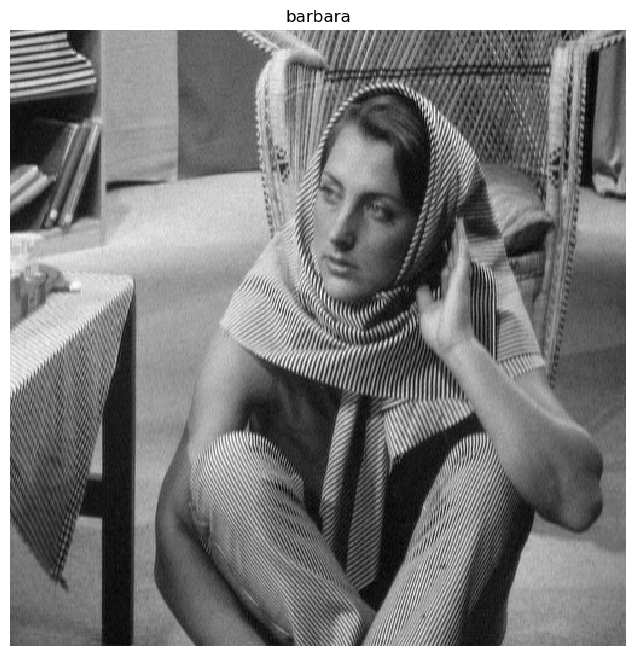

height:  510
width:  510
channel: 1


In [36]:
### Your code to load and display your images here

#image2
image2 = load('images/building.jpeg')
      
display(image2, 'building')

print_stats(image2)

#image3
image3 = load('images/barbara.jpeg')
      
display(image3, 'barbara')

print_stats(image3)



***Your explanation of images here***

## image2 - building

I chose this image because it is a colorful image of a real scene, capturing the intricate details and vibrant colors. By using this image as a test case, I can effectively evaluate and showcase the performance of image processing algorithms on color images. Additionally, in the Sobel filters section, I can clearly demonstrate the distinction between using the horizontal kernel and the vertical kernel, highlighting the effects of different filter orientations on edge detection and gradient computation.

## image3 - barbara

It is one of the standard test images commonly used in the field of computer vision. It contains a variety of different textures, edges and details that make it suitable for testing the performance of image processing algorithms. By processing and analysing this image, I can test and demonstrate the effects of image processing algorithms on a greyscale image and observe the effects of image processing on texture, edges and detail.

## Question 2: Image processing (25%)

Now that you have an image stored as a numpy array, let's try some operations on it.

1. Implement the `crop()` function in a1code.py. Use array slicing to crop the image.
2. Implement the `resize()` function in a1code.py.
3. Implement the `change_contrast()` function in a1code.py.
4. Implement the `greyscale()` function in a1code.py.
5. Implement the `binary()` function in a1code.py.

What do you observe when you change the threshold of the binary function?

Apply all these functions with different parameters on your own test images.

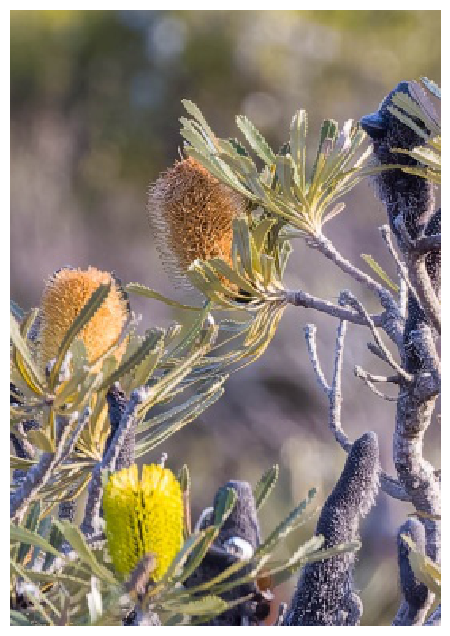

height:  389
width:  272
channel:  3


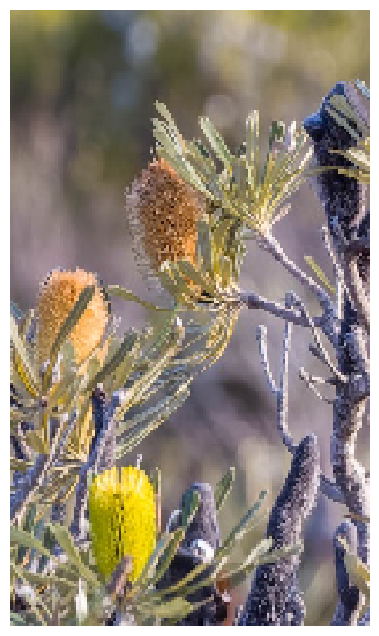

height:  233
width:  136
channel:  3


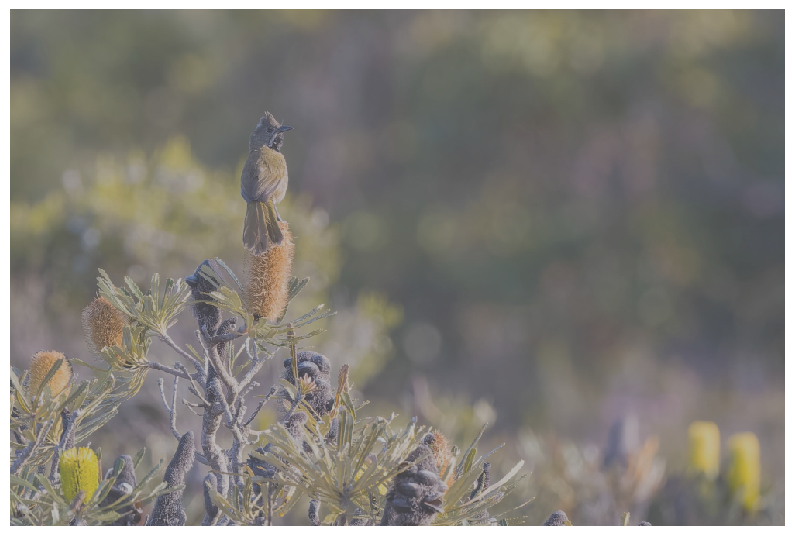

height:  667
width:  1000
channel:  3


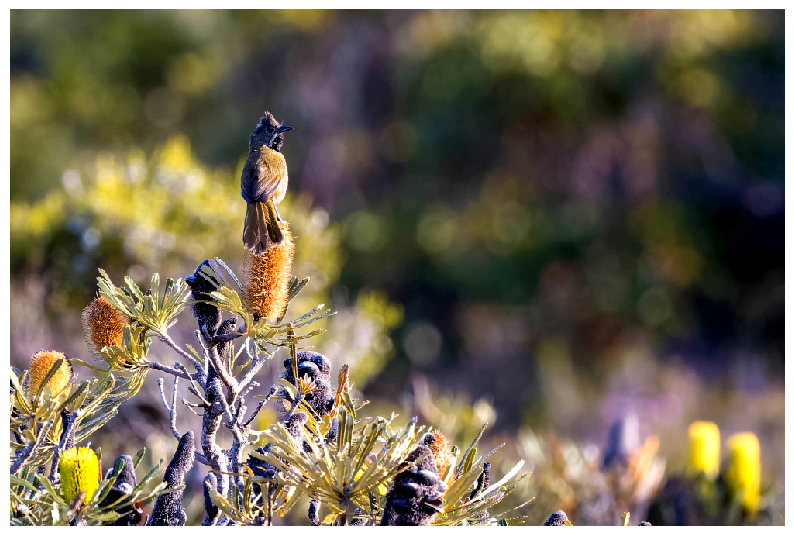

height:  667
width:  1000
channel:  3


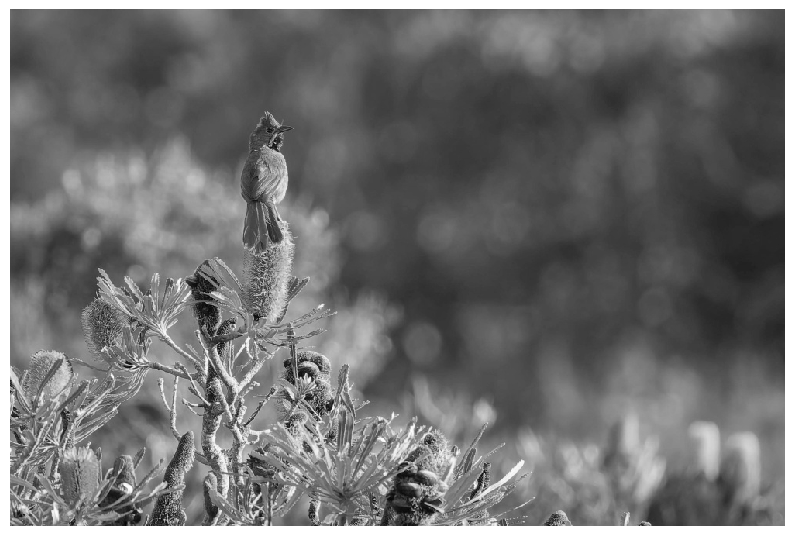

height:  667
width:  1000
channel:  3


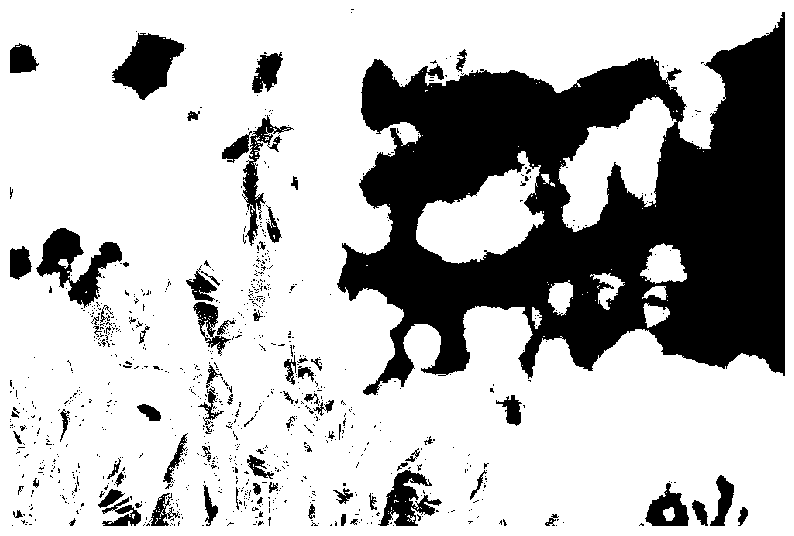

height:  667
width:  1000
channel: 1


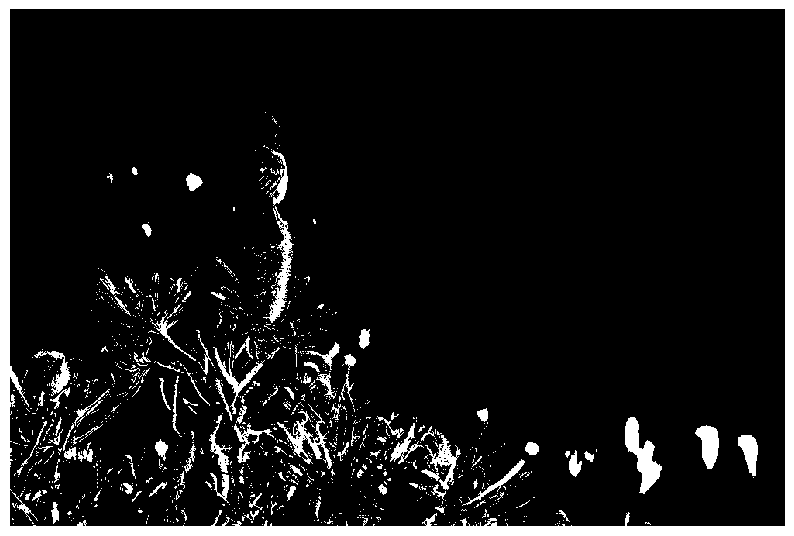

height:  667
width:  1000
channel: 1


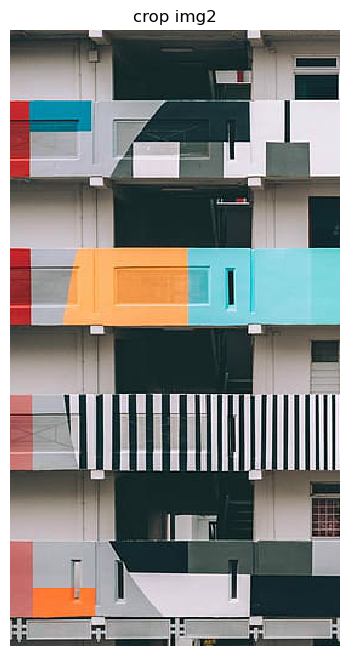

height:  508
width:  272
channel:  3


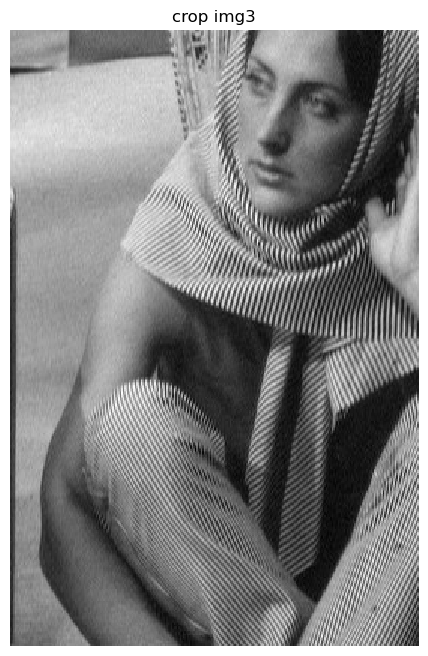

height:  410
width:  272
channel: 1


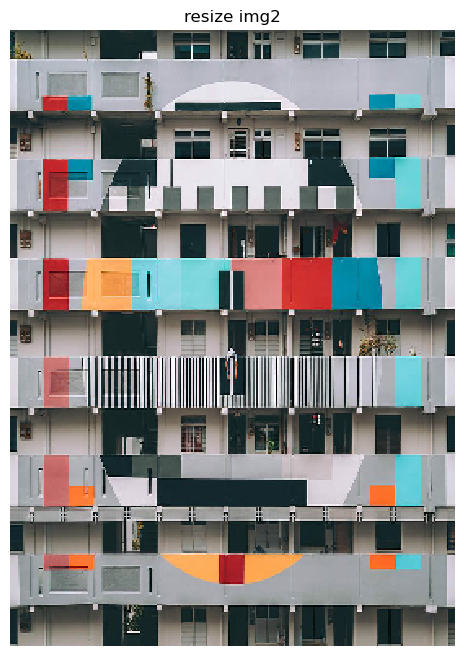

height:  378
width:  273
channel:  3


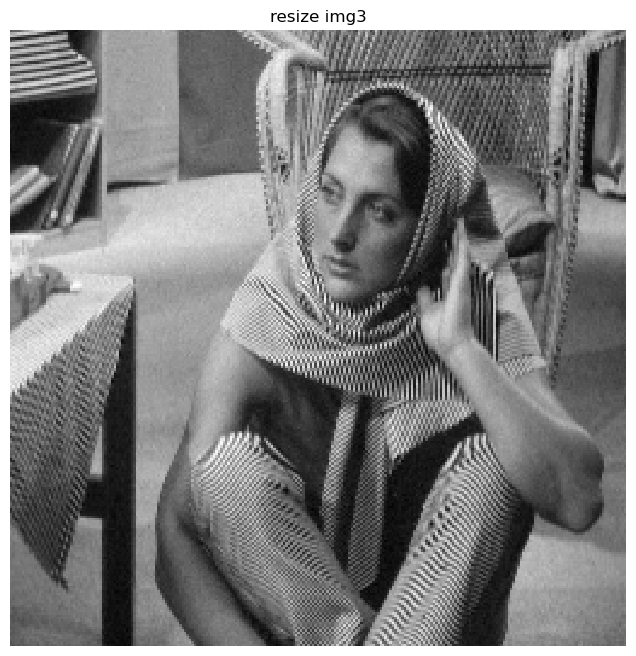

height:  255
width:  255
channel:  3


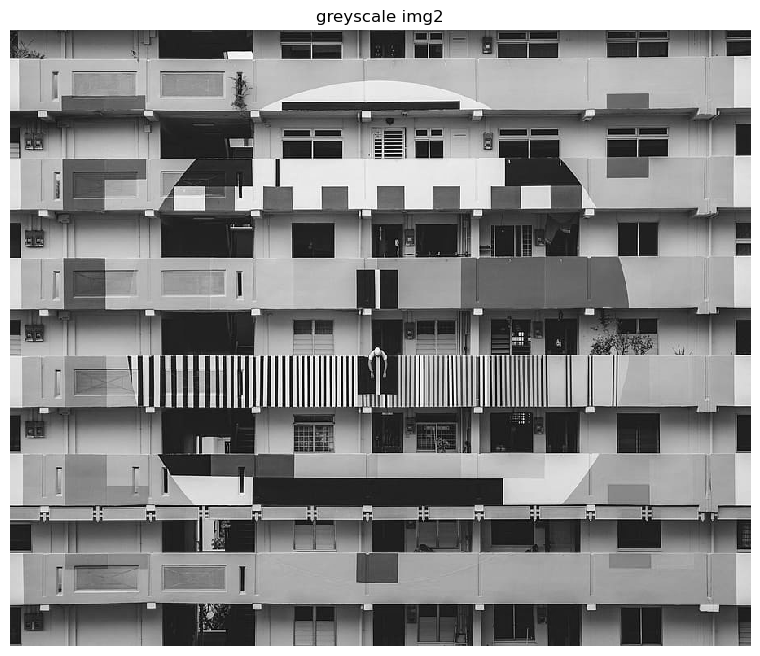

height:  757
width:  910
channel:  3


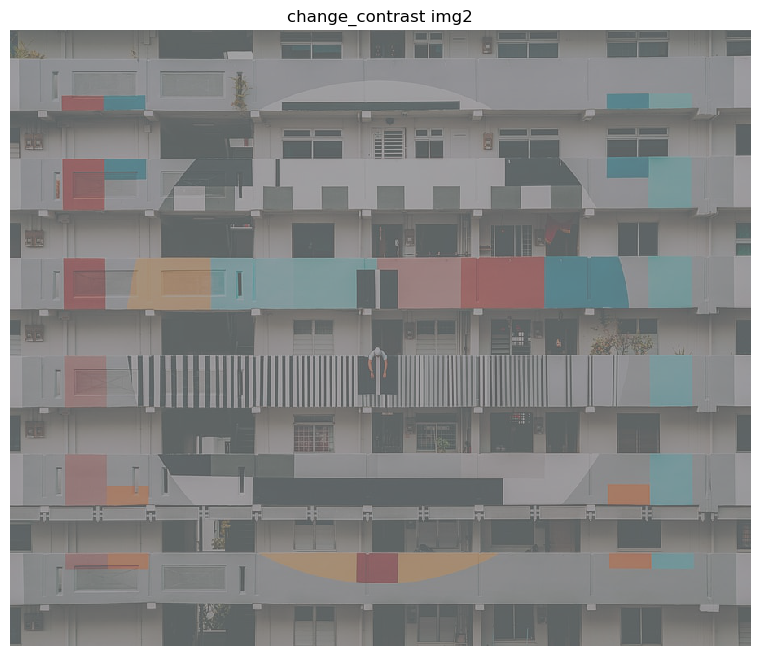

height:  757
width:  910
channel:  3


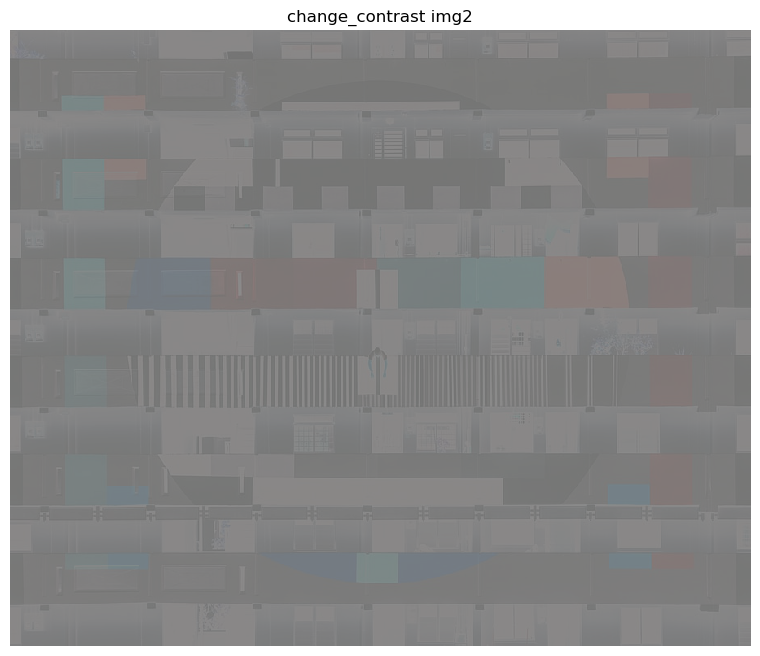

height:  757
width:  910
channel:  3


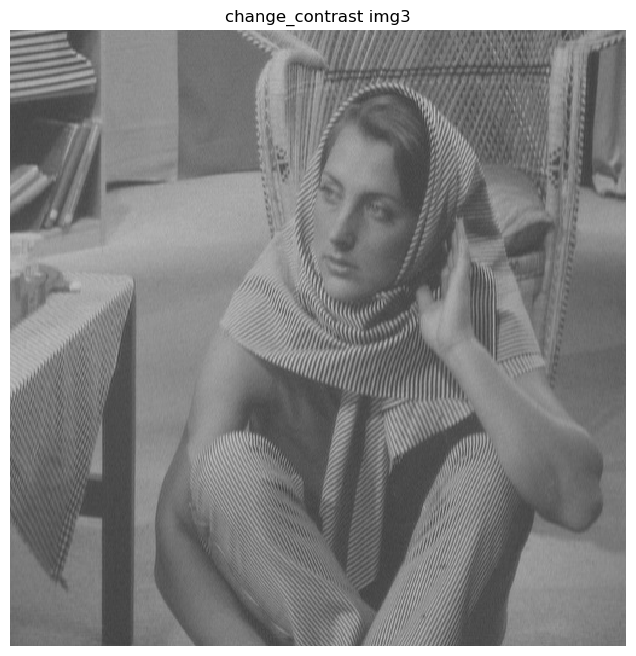

height:  510
width:  510
channel:  3


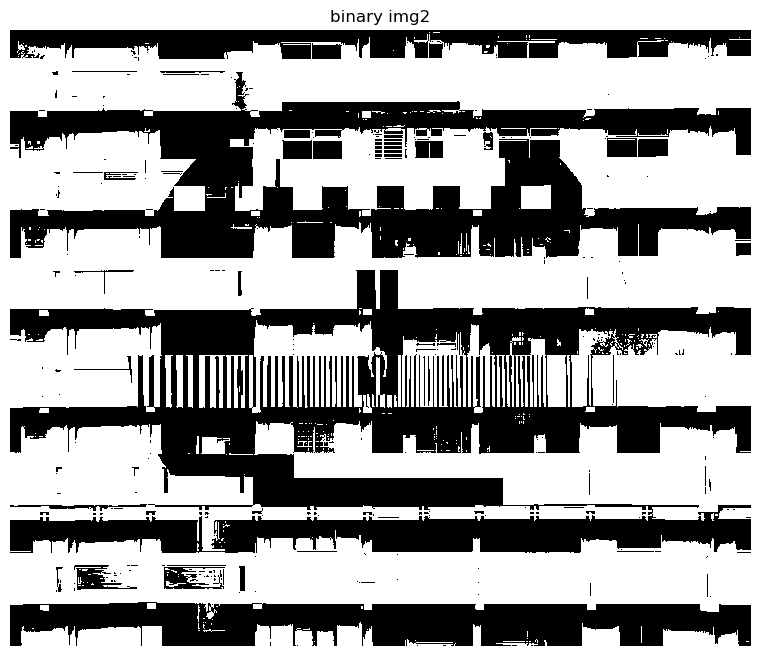

height:  757
width:  910
channel: 1


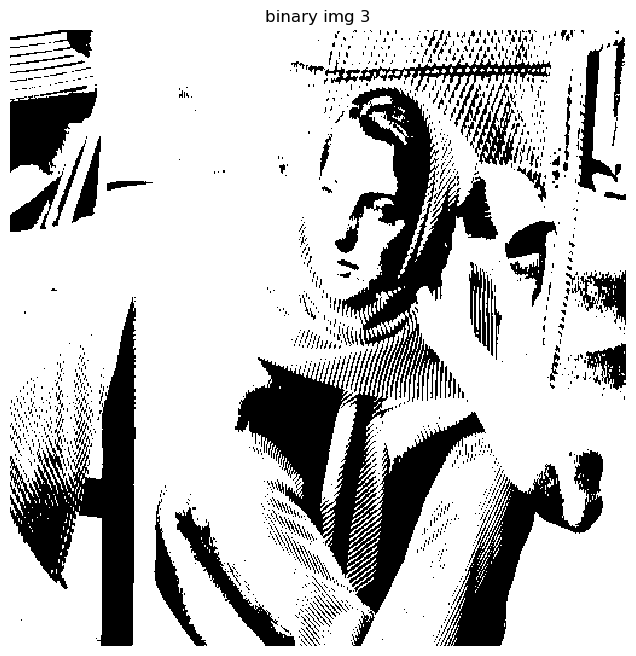

height:  510
width:  510
channel: 1


In [37]:
# This should crop the bird from the  image; you will need to adjust the parameters for the correct crop size and location 
crop_img = crop(image1, 278, 5, 508, 272)
display(crop_img) 
print_stats(crop_img)

resize_img = resize(crop_img, 0.5, 0.6)
display(resize_img)
print_stats(resize_img)

contrast_img = change_contrast(image1, 0.5)
display(contrast_img)
print_stats(contrast_img)

contrast_img = change_contrast(image1, 1.5)
display(contrast_img)
print_stats(contrast_img)

grey_img = greyscale(image1)
display(grey_img)
print_stats(grey_img)

binary_img = binary(grey_img, 0.3)
display(binary_img)
print_stats(binary_img)

binary_img = binary(grey_img, 0.7)
display(binary_img)
print_stats(binary_img)

# Add your own tests here...

# crop
crop_img2 = crop(image2, 100, 100, 508, 272)
display(crop_img2,"crop img2") 
print_stats(crop_img2)

crop_img3 = crop(image3, 100, 100, 508, 272)
display(crop_img3,"crop img3") 
print_stats(crop_img3)

# resize
resize_img2 = resize(image2, 0.3, 0.5)
display(resize_img2,"resize img2")
print_stats(resize_img2)

resize_img3 = resize(image3, 0.5, 0.5)
display(resize_img3,"resize img3")
print_stats(resize_img3)

#grey scale
grey_img2 = greyscale(image2)
display(grey_img2,"greyscale img2")
print_stats(grey_img2)

# change_contrast
contrast_img2 = change_contrast(image2, 0.3)
display(contrast_img2,"change_contrast img2")
print_stats(contrast_img2)

contrast_img21 = change_contrast(contrast_img2, -0.3)
display(contrast_img21,"change_contrast img2")
print_stats(contrast_img21)

contrast_img3 = change_contrast(image3, 0.5)
display(contrast_img3,"change_contrast img3")
print_stats(contrast_img3)

# binary
binary_img2 = binary(image2, 0.5)
display(binary_img2, "binary img2")
print_stats(binary_img2)

binary_img3 = binary(image3, 0.3)
display(binary_img3,"binary img 3")
print_stats(binary_img3)


***Your explanation of images here***

### Explain contrast not reversible
In the test case of contrast_img21, it demonstrates that contrast is irreversible. When a contrast adjustment is applied to an image, it actually changes the distribution of pixel values over the brightness range.
However, the adjustment process involves mapping the original pixel values to new values based on a contrast factor. This mapping is a one-way conversion and some information from the original image may be lost in the process. As a result, it is not possible to accurately reverse the contrast adjustment and recover the original image.


## Question 3: Convolution (25%)

### 3.1 2D convolution

Using the definition of 2D convolution from week 1, implement the convolution operation in the function `conv2D()` in a1code.py.


In [38]:
test_conv2D()

### 3.2 RGB convolution

In the function `conv` in a1code.py, extend your function `conv2D` to work on RGB images, by applying the 2D convolution to each channel independently. 

### 3.3 Gaussian filter convolution

Use the `gauss2D` function provided in a1code.py to create a Gaussian kernel, and apply it to your images with convolution. You will obtain marks for trying different tests and analysing the results, for example:

- try varying the image size, and the size and variance of the filter  
- subtract the filtered image from the original - this gives you an idea of what information is lost when filtering

What do you observe and why?

### 3.4 Sobel filters

Define a horizontal and vertical Sobel edge filter kernel and test them on your images. You will obtain marks for testing them and displaying results in interesting ways, for example:

- apply them to an image at different scales
- considering how to display positive and negative gradients
- apply different combinations of horizontal and vertical filters

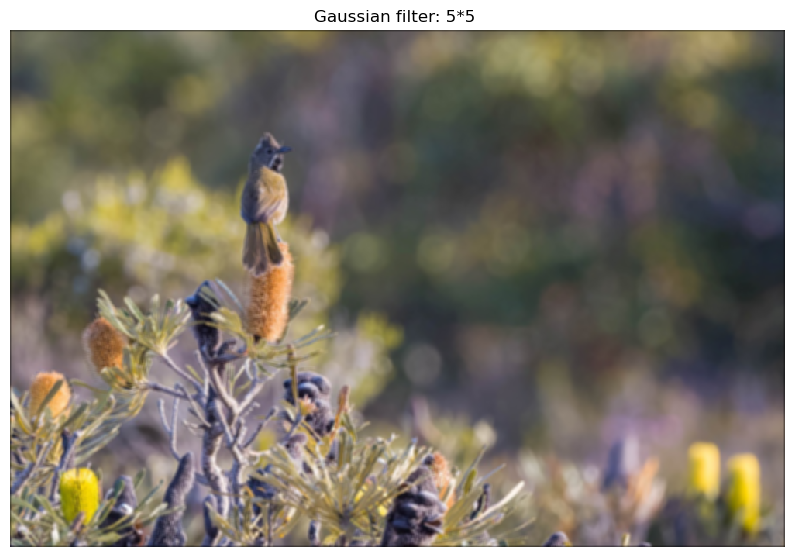

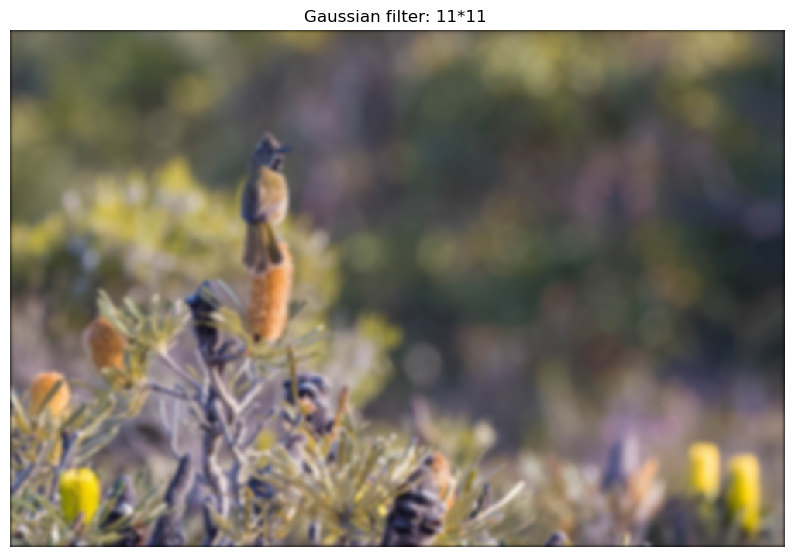

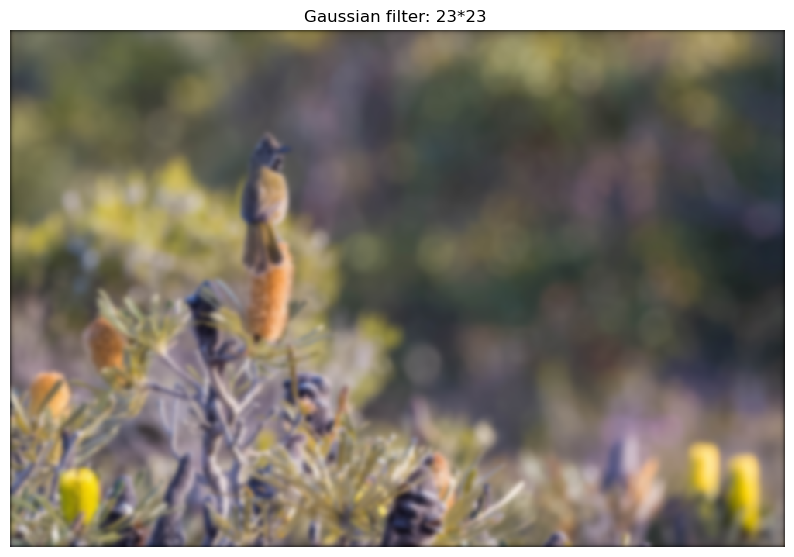

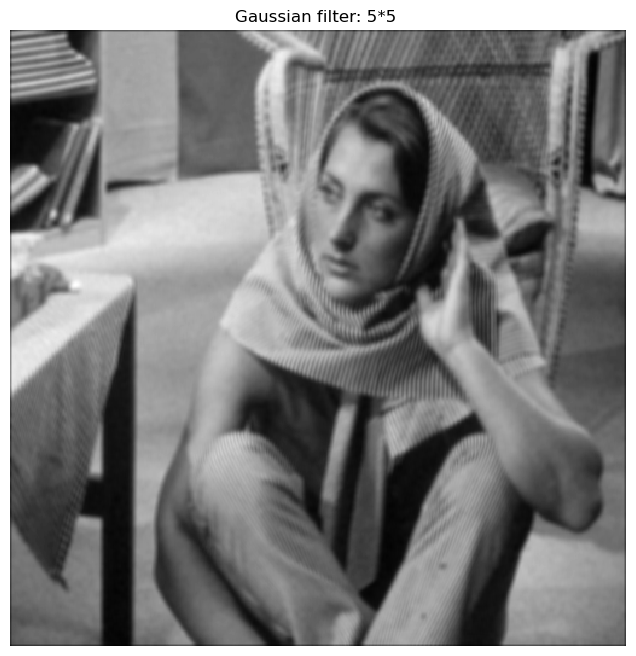

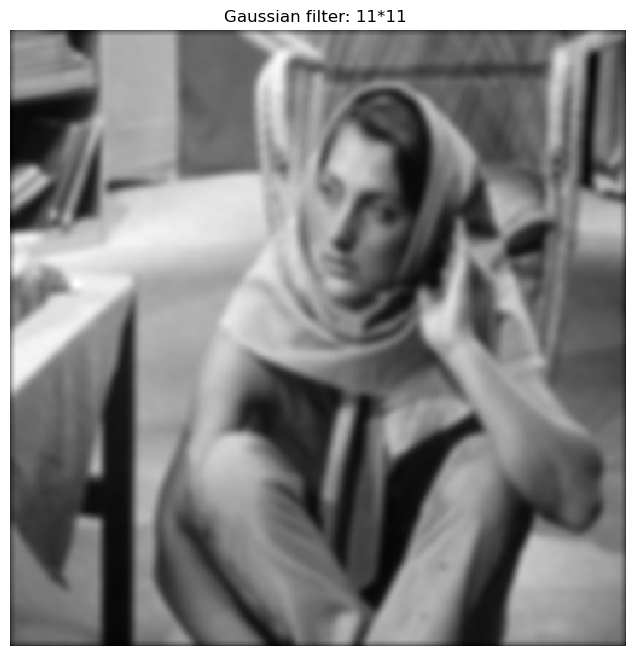

...

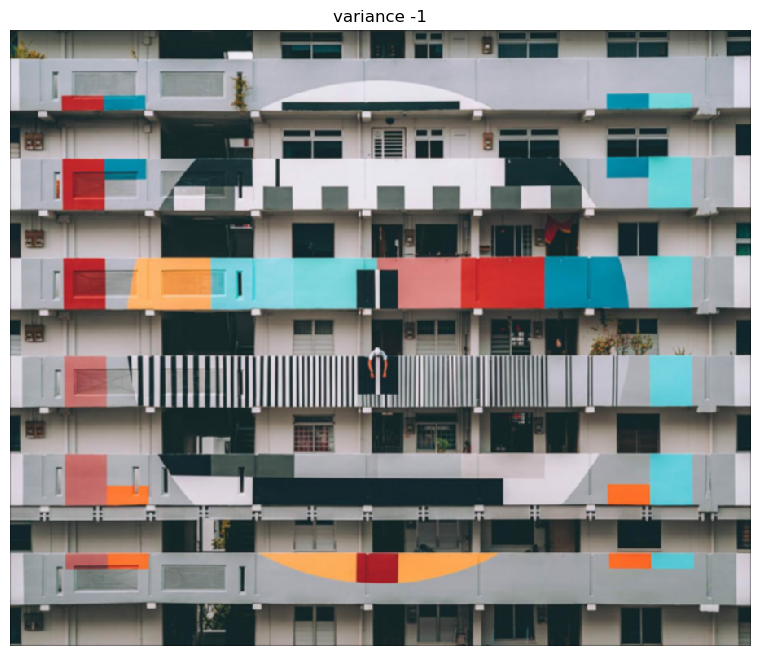

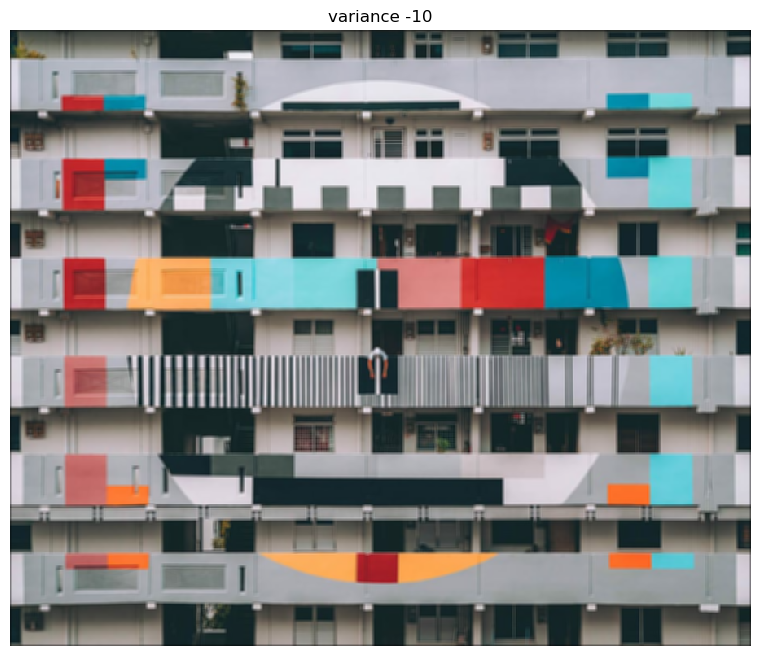

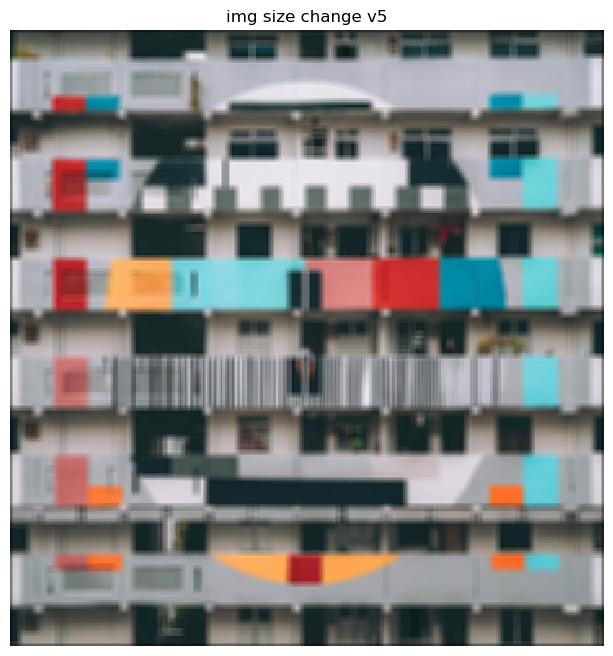

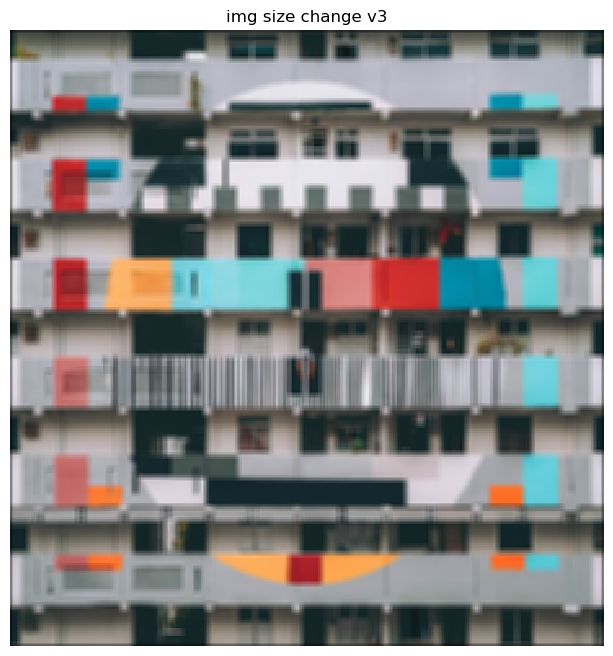

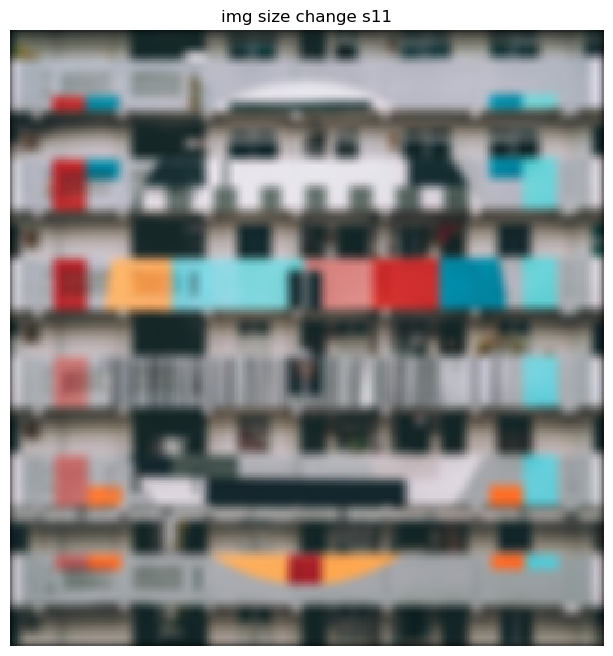

In [39]:
# Your code to answer 3.3, 3.4 and display results here.

# 3.3 Gaussian filter convolution

# fliter size changing
# img 1
conv_img1 = conv(image1, gauss2D(5, 3))
display(conv_img1, "Gaussian filter: 5*5 ")

conv_img2 = conv(image1, gauss2D(11, 3))
display(conv_img2, "Gaussian filter: 11*11 ")

conv_img3 = conv(image1, gauss2D(23, 3))
display(conv_img3, "Gaussian filter: 23*23 ")

# img 3 - greyscale - human
conv_img4 = conv(image3, gauss2D(5, 3))
display(conv_img4, "Gaussian filter: 5*5 ")

conv_img5 = conv(image3, gauss2D(11, 3))
display(conv_img5, "Gaussian filter: 11*11 ")

conv_img6 = conv(image3, gauss2D(23, 3))
display(conv_img6, "Gaussian filter: 23*23 ")

# variance changing
# image 2
conv_img7 = conv(image2, gauss2D(5, 5))
display(conv_img7, "variance 5")

conv_img8 = conv(image2, gauss2D(5, 1))
display(conv_img8, "variance 1")

conv_img9 = conv(image2, gauss2D(5, -1))
display(conv_img9, "variance -1")

conv_img10 = conv(image2, gauss2D(5, -10))
display(conv_img10, "variance -10")

# image size changing
# image 2
img_size1 = resize(image2, 0.4, 0.5)
conv_img11 = conv(img_size1, gauss2D(5, 5))
display(conv_img11, "img size change v5")

conv_img12 = conv(img_size1, gauss2D(5, 3))
display(conv_img12, "img size change v3")

conv_img13 = conv(img_size1, gauss2D(11, 3))
display(conv_img13, "img size change s11")

# 3.4 see below

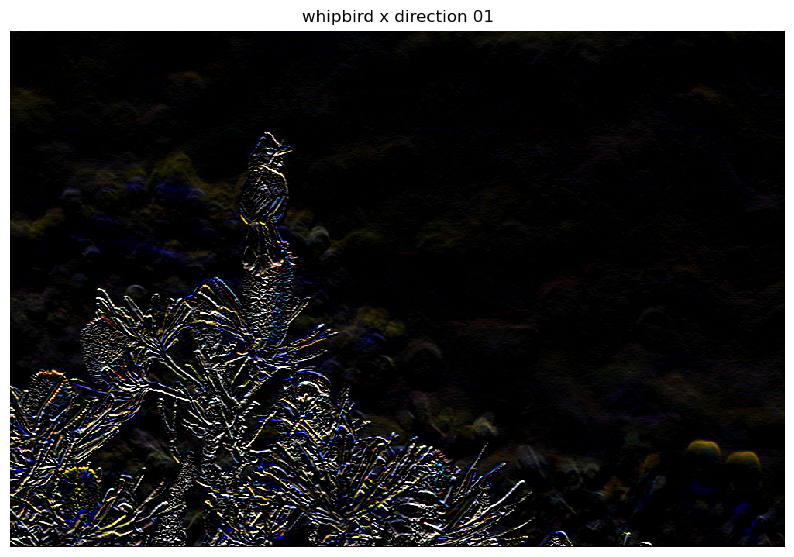

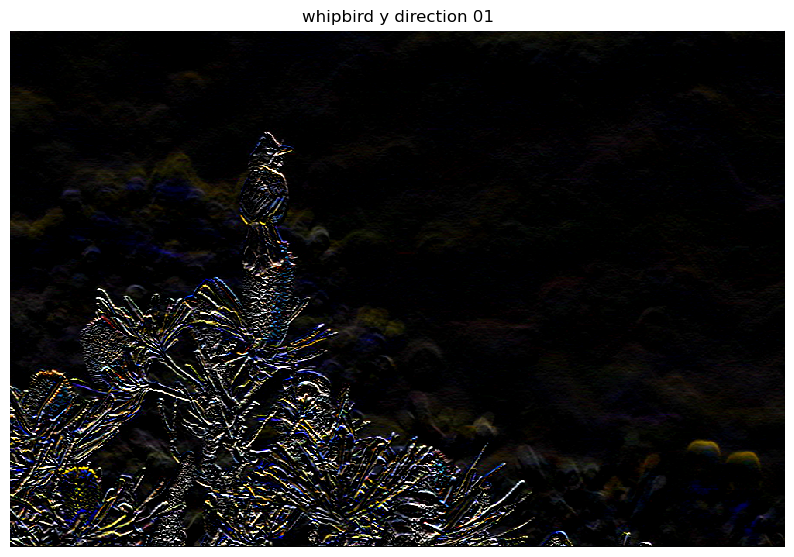

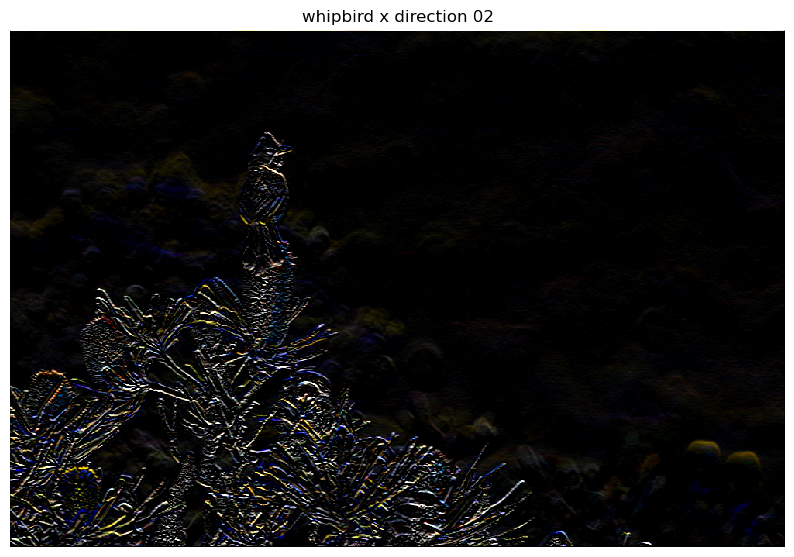

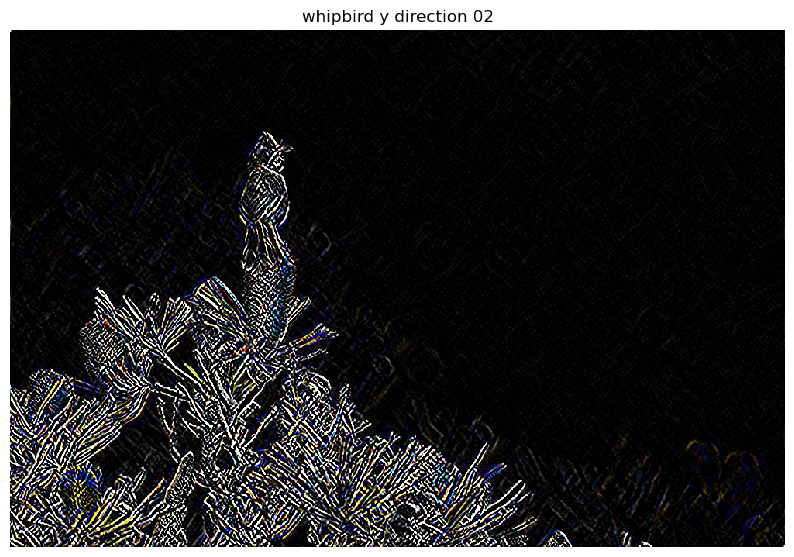

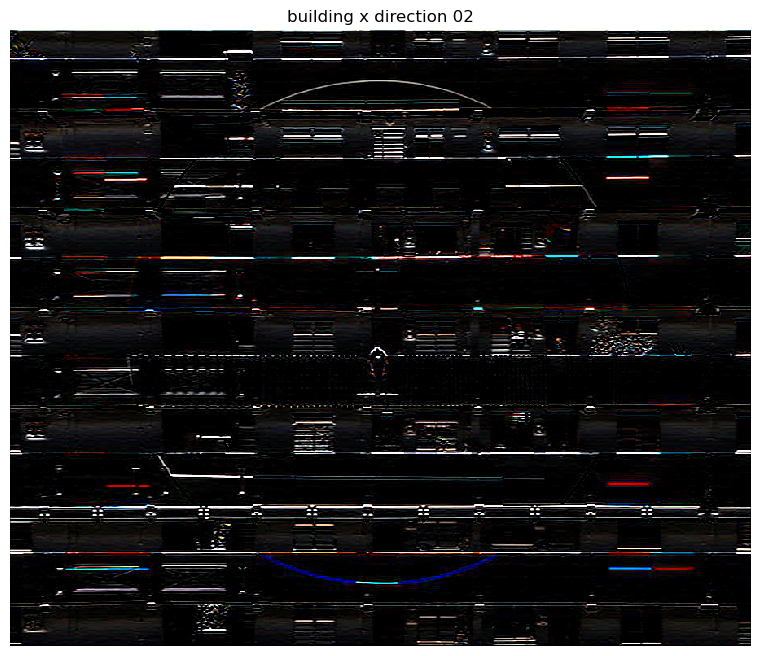

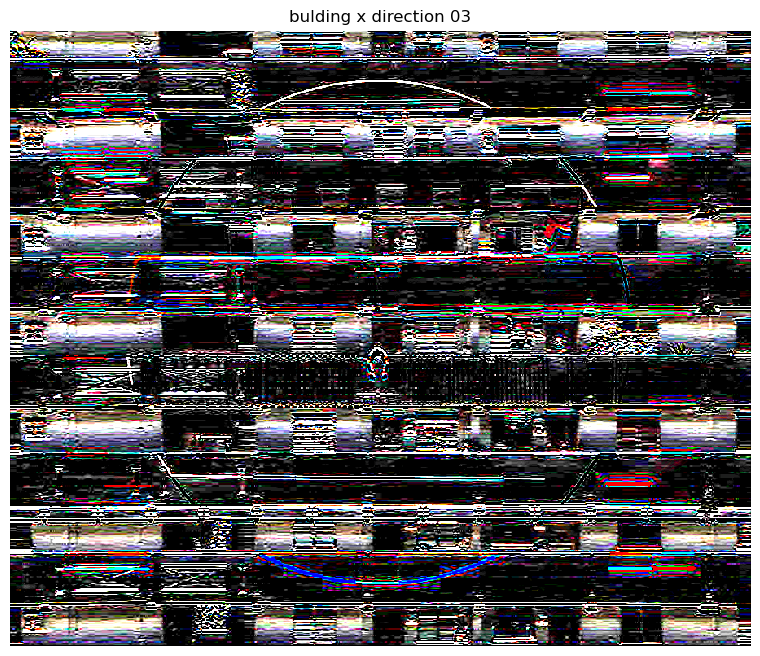

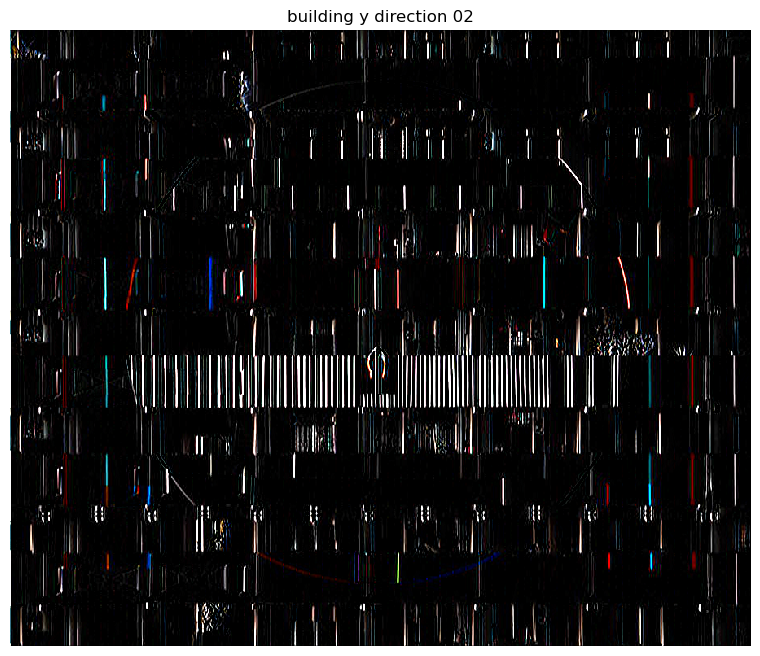

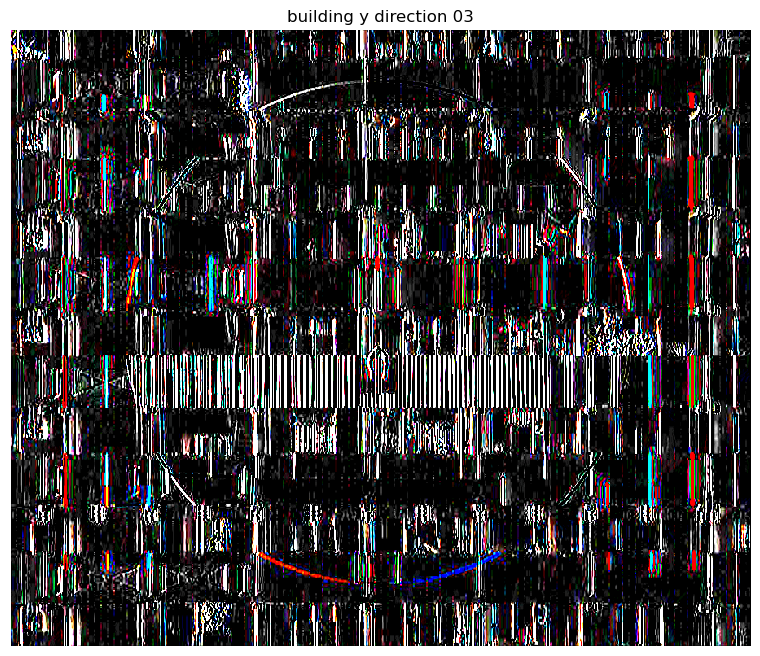

In [41]:
# 3.4 Sobel filters

# Define a horizontal and vertical Sobel edge filter kernel and test them on your images. You will obtain marks for testing them and displaying results in interesting ways, for example:

# - apply them to an image at different scales
# - considering how to display positive and negative gradients
# - apply different combinations of horizontal and vertical filters

# Horizontal Sobel filter
x_01 = [[1,  2,  1], [0, 0, 0], [-1, -2, -1]]
x_02 = [[1,  1,  1], [0, 0, 0], [-1, -1, -1]]
x_03 = [[10,  10,  10], [0, 0, 0], [-10, -10, -10]]

# Vertical sobel filter
y_01 = [[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]]
y_02 = [[1, 0, -1], [1, 0, -1], [1, 0, -1]]
y_03 = [[10, 0, -10], [10, 0, -10], [10, 0, -10]]

# image 1
image01_x1 = conv(image1, x_01)
display(image01_x1, "whipbird x direction 01")

image01_y1 = conv(image1, x_01)
display(image01_y1, "whipbird y direction 01")

image01_x2 = conv(image1, x_01)
display(conv(image1, x_02), "whipbird x direction 02")

image01_y2 = conv(image1, x_01)
display(conv(image01_y2, y_02), "whipbird y direction 02")

# image 2 - building
image02_x2 = conv(image2, x_02)
display(image02_x2, "building x direction 02")

image02_x3 = conv(image2, x_03)
display(image02_x3, "bulding x direction 03")

image02_y2 = conv(image2, y_02)
display(image02_y2, "building y direction 02")

image02_y3 = conv(image2, y_03)
display(image02_y3, "building y direction 03")


***Your comments/analysis of your results here...***

### 3.3 Gaussian filter convolution

- 1. From the Gaussian filter convolution test, when I changed the fliter size, the image became more blurred as the size increased. 

This is because a larger filter size means that it will cover more pixels and take more neighbouring pixels into account when calculating the average. A larger filter will therefore average out more pixel values. Smaller details will be averaged out or blurred out, making the image smoother overall.
Pixels further from the centre have lower weights, while pixels closer to the centre have higher weights. When the filter size is increased, pixels further from the centre will contribute less to the average, resulting in a stronger smoothing effect.

- 2. As the variance approaches zero, the picture becomes sharper

As the variance gradually approaches zero, the weight distribution of the Gaussian filter becomes more concentrated around the central pixel. This means that the filter places more emphasis on the central pixel and reduces the impact on the surrounding pixels. As low variance indicates less variation in pixel values, pixel values closer to the centre pixel are more representative of the detailed information in the original image. As a result, the effect of the Gaussian filter becomes clearer as the variance approaches zero.

### 3.4 Sobel filters

- 1. The Sobel filter can be used to detect edge information in an image. The horizontal Sobel filter detects mainly vertical edges, while the vertical Sobel filter detects mainly horizontal edges.

The Sobel filter can be used to detect edge information in an image. The horizontal Sobel filter detects mainly vertical edges, while the vertical Sobel filter detects mainly horizontal edges. As horizontal edges vary in the vertical direction, the horizontal Sobel filter is able to capture this variation and therefore it is mainly used to detect vertical edges. The same applies to the vertical sobel filter.

- 2. Smaller scales can detect fine edges, while larger scales can detect coarser edges.

The smaller scale Sobel filter has a smaller convolution kernel size, which is more sensitive to subtle changes in the image. As subtle edge changes typically have higher spatial frequencies, the smaller scale Sobel filter is better able to capture these high frequency details and produce a stronger response.

Larger scale Sobel filters are more sensitive to lower frequency edge variations, which typically have a larger spatial range.

## Question 4: Image sampling and pyramids (35%)

### 4.1 Image Sampling

Apply your `resize()` function to reduce an image (I) to 0.5 height and width

Repeat the above procedure, but apply a Gaussian blur filter to your original image before downsampling it. How does the result compare to your previous output, and to the original image? Why?


### 4.2 Image Pyramids 
Creat a Gaussian pyramid as described in week2's lecture on an image.

Apply a Gaussian kernel to an image I, and resize it with ratio 0.5, to get $I_1$. Repeat this step to get $I_2$, $I_3$ and $I_4$.

Display these four images in a manner analogus to the example shown in the lectures.




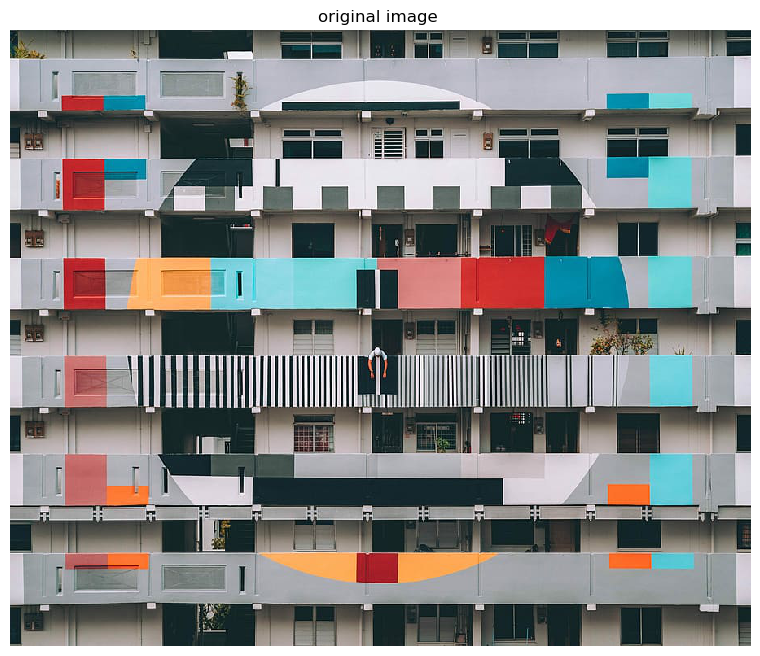

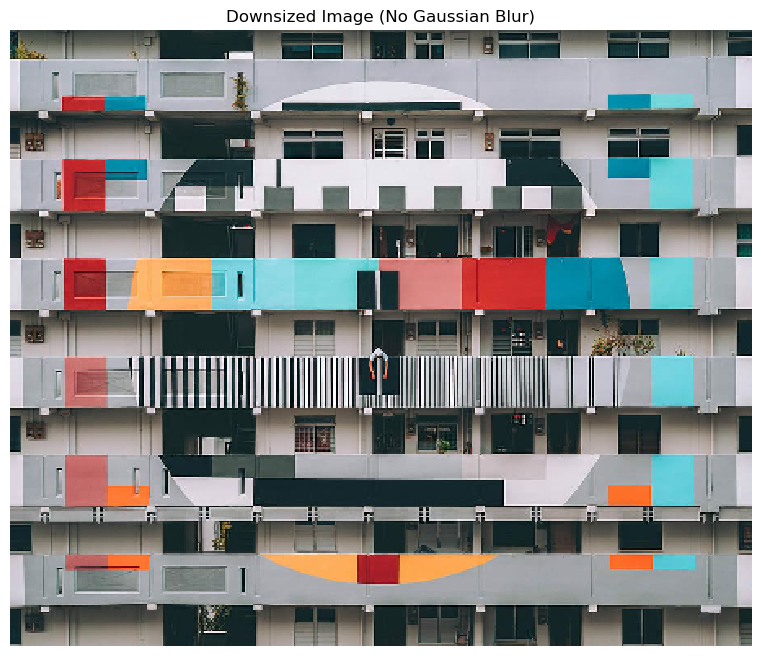

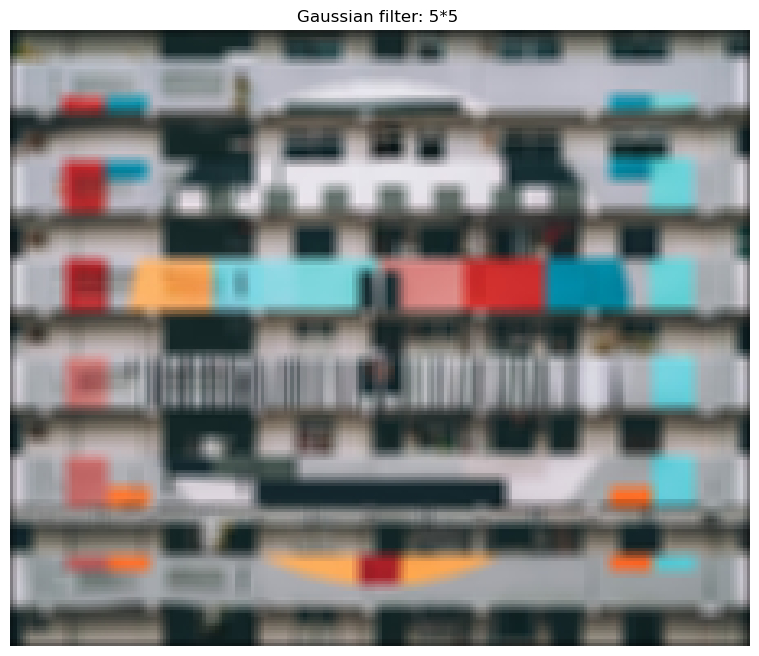

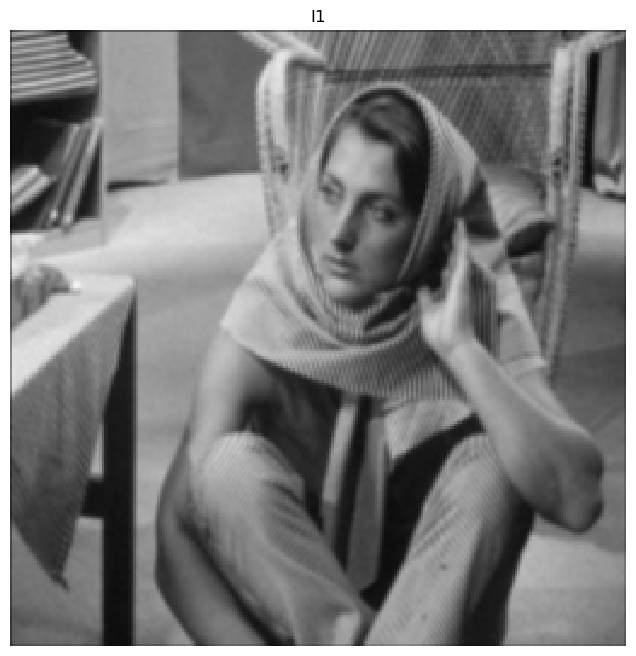

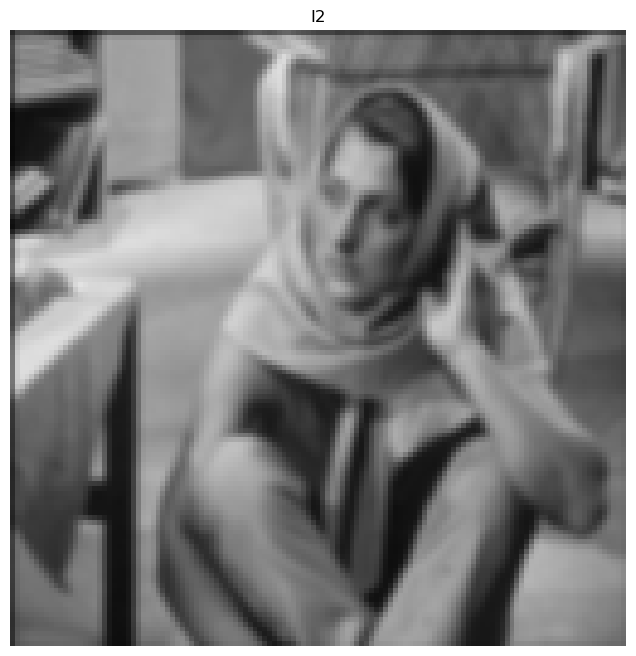

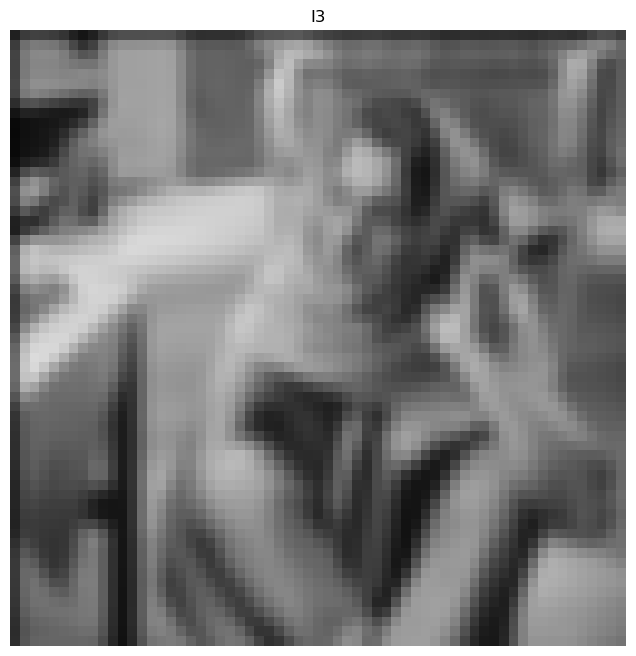

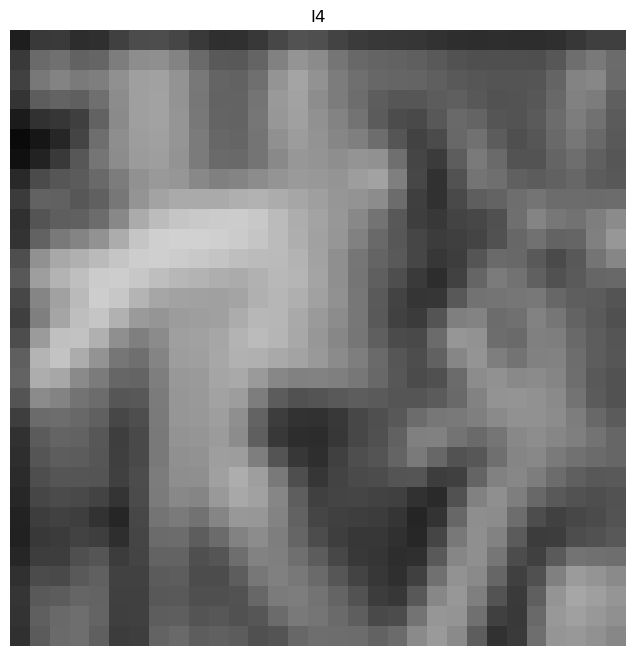

In [15]:
# Your answers to question 4 here

# 4.1 Image Sampling

display(image2, "original image ")

resize_img2 = resize(image2, 0.5, 0.5)
display(resize_img2, "Downsized Image (No Gaussian Blur)")

resize_img3 = resize(resize_img2, 0.5, 0.5)
display(conv(resize_img3, gauss2D(5, 3)), "Gaussian filter: 5*5 ")

# 4.2 Image Pyramids 

# image I
# I1
I = conv(image3, gauss2D(5, 3))
I1 = resize(I, 0.5, 0.5)
display(I1, "I1")

# I2
I1 = conv(I1, gauss2D(5, 3))
I2 = resize(I1, 0.5, 0.5)
display(I2, "I2")

# I3
I2 = conv(I2, gauss2D(5, 3))
I3 = resize(I2, 0.5, 0.5)
display(I3, "I3")

# I4
I3 = conv(I3, gauss2D(5, 3))
I4 = resize(I3, 0.5, 0.5)
display(I4, "I4")

***Your comments/analysis of your results here...***

### 4.1 How does the result compare to your previous output, and to the original image? Why?

- 1. The use of the resize() function results in a reduction in the size of the image, while retaining the content of the original image. The result is a lower resolution image with less detail, but with the overall scale and structure of the image maintained.

- 2. Applying the blur filter before sampling reduces noise and nuances in the image, making the resulting image smoother and more blurred.

### 4.2 Comments and explanation of 4.2 outputs

- 1. During successive applications of the Gaussian blur filter and the sampling operation, the image gradually becomes blurred as the operation is repeated.

In each sampling operation, the pixels of the image are reduced and the information in the image is correspondingly reduced. This results in the loss of detail in the image, which further exacerbates the blurring effect of the image.

- 2. Successive applications of the Gaussian blur filter and sampling operations can create a multi-scale image pyramid.

## Question 5: Auto correlation (optional, unassessed)

Recall from week 2 that cross-correlation is a measure of similarity between a template and an image. It is defined similarly to convolution.

### 5.1 Correlation function

Implement the function `corr()` in a1code.py, based on your convolution function. Hint: numpy's `flip()` function may be useful here.

### 5.2 Auto-correlation

We will experiment with *auto-correlation*, where the template patch is taken from the image it is being compared to. Use a crop from your image as your template. Calculate the correlation of that template with every location in the image, and display the output as an image. Where is the maximum similarity? (Hint: numpy functions `argmax()` and `unravel()` will be useful here). For simplicity, you can use a greyscale version of the image and template.

Try this on an image with some symmetry, such as a person's face and crop the eye.




In [ ]:
# Your code to answer question 5 and display results here